In [3]:
# ============================================================
# CELL 1 — INSTALL / IMPORT DEPENDENCIES
# ============================================================

!pip install -q transformers librosa soundfile torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 943.8 kB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 8.2 MB/s eta 0:00:00a 0:00:01


In [4]:
# ============================================================
# CELL 2 — IMPORTS + CONFIGURATION
# ============================================================

import os
import ast
import glob
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

import torchaudio
import librosa
import soundfile as sf

from transformers import AutoTokenizer, AutoModel

from torch_geometric.data import Data, Batch
from torch_geometric.nn import SAGEConv, global_mean_pool

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score

from tqdm.auto import tqdm

warnings.filterwarnings("ignore")


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)


# ------------------------------------------------------------
# Device
# ------------------------------------------------------------

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", DEVICE)


# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------



CSV_PATH =  "/kaggle/input/datasets/googleai/musiccaps/musiccaps-public.csv"

AUDIO_DIR = Path("/kaggle/input/datasets/pinal03/musiccaps/music_data")

print("CSV:", CSV_PATH)
print("Audio directory:", AUDIO_DIR)


# ------------------------------------------------------------
# Model configuration
# ------------------------------------------------------------

SAMPLE_RATE = 16000

AUDIO_DURATION = 10

NUM_SEGMENTS = 10

SEGMENT_DURATION = AUDIO_DURATION / NUM_SEGMENTS

N_MELS = 64
N_MFCC = 20
N_CHROMA = 12

NODE_FEATURE_DIM = N_MELS + N_MFCC + N_CHROMA

GNN_HIDDEN = 128

EMBED_DIM = 256

BERT_NAME = "bert-base-uncased"

MAX_TEXT_LENGTH = 128

NUM_GNN_LAYERS = 2

TEMPERATURE = 0.07

BATCH_SIZE = 16

NUM_EPOCHS = 10

LEARNING_RATE = 2e-5

WEIGHT_DECAY = 1e-4

NUM_WORKERS = 2

FREEZE_BERT = False

print("Node feature dimension:", NODE_FEATURE_DIM)

Device: cuda
CSV: /kaggle/input/datasets/googleai/musiccaps/musiccaps-public.csv
Audio directory: /kaggle/input/datasets/pinal03/musiccaps/music_data
Node feature dimension: 96


In [5]:
# ============================================================
# CELL 3 — LOAD MUSICCAPS METADATA
# ============================================================

df = pd.read_csv(CSV_PATH)

print("Dataset shape:", df.shape)

print("\nColumns:")
print(df.columns.tolist())

display(df.head())

Dataset shape: (5521, 9)

Columns:
['ytid', 'start_s', 'end_s', 'audioset_positive_labels', 'aspect_list', 'caption', 'author_id', 'is_balanced_subset', 'is_audioset_eval']


,ytid,start_s,end_s,audioset_positive_labels,aspect_list,caption,author_id,is_balanced_subset,is_audioset_eval
0,-0Gj8-vB1q4,30,40,"/m/0140xf,/m/02cjck,/m/04rlf","['low quality', 'sustained strings melody', 's...",The low quality recording features a ballad so...,4,False,True
1,-0SdAVK79lg,30,40,"/m/0155w,/m/01lyv,/m/0342h,/m/042v_gx,/m/04rlf...","['guitar song', 'piano backing', 'simple percu...",This song features an electric guitar as the m...,0,False,False
2,-0vPFx-wRRI,30,40,"/m/025_jnm,/m/04rlf","['amateur recording', 'finger snipping', 'male...",a male voice is singing a melody with changing...,6,False,True
3,-0xzrMun0Rs,30,40,"/m/01g90h,/m/04rlf","['backing track', 'jazzy', 'digital drums', 'p...",This song contains digital drums playing a sim...,6,False,True
4,-1LrH01Ei1w,30,40,"/m/02p0sh1,/m/04rlf","['rubab instrument', 'repetitive melody on dif...",This song features a rubber instrument being p...,0,False,False


In [6]:
# ============================================================
# CELL 4 — MATCH WAV FILES TO YTID
# ============================================================

wav_files = list(AUDIO_DIR.rglob("*.wav"))

print("Number of WAV files found:", len(wav_files))

# Create:
# ytid -> audio path
audio_map = {}

for wav_path in wav_files:
    ytid = wav_path.stem
    
    if ytid not in audio_map:
        audio_map[ytid] = str(wav_path)

print("Unique audio IDs:", len(audio_map))


# ------------------------------------------------------------
# Match CSV rows with audio
# ------------------------------------------------------------

df["audio_path"] = df["ytid"].map(audio_map)

matched = df["audio_path"].notna()

print("\nMatched:", matched.sum())
print("Missing:", (~matched).sum())


# Keep only examples with audio
df = df[matched].copy()

df = df.reset_index(drop=True)

print("\nFinal dataset:", df.shape)

display(
    df[
        [
            "ytid",
            "caption",
            "audio_path",
            "is_audioset_eval"
        ]
    ].head()
)

Number of WAV files found: 5419
Unique audio IDs: 5419

Matched: 5419
Missing: 102

Final dataset: (5419, 10)


,ytid,caption,audio_path,is_audioset_eval
0,-0Gj8-vB1q4,The low quality recording features a ballad so...,/kaggle/input/datasets/pinal03/musiccaps/music...,True
1,-0SdAVK79lg,This song features an electric guitar as the m...,/kaggle/input/datasets/pinal03/musiccaps/music...,False
2,-0vPFx-wRRI,a male voice is singing a melody with changing...,/kaggle/input/datasets/pinal03/musiccaps/music...,True
3,-0xzrMun0Rs,This song contains digital drums playing a sim...,/kaggle/input/datasets/pinal03/musiccaps/music...,True
4,-1LrH01Ei1w,This song features a rubber instrument being p...,/kaggle/input/datasets/pinal03/musiccaps/music...,False


In [7]:
# ============================================================
# CELL 5 — TRAIN / VALIDATION / TEST SPLIT
# ============================================================

# Normalize boolean column
def parse_bool(x):
    if isinstance(x, bool):
        return x
    
    if pd.isna(x):
        return False
    
    return str(x).lower() in [
        "true",
        "1",
        "yes"
    ]


df["is_audioset_eval"] = df["is_audioset_eval"].apply(parse_bool)


# Official evaluation split
test_df = df[df["is_audioset_eval"] == True].copy()

# Development/training split
train_pool = df[df["is_audioset_eval"] == False].copy()


# Validation split
train_df, val_df = train_test_split(
    train_pool,
    test_size=0.10,
    random_state=SEED
)


train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)


print("Train:", len(train_df))
print("Validation:", len(val_df))
print("Test:", len(test_df))

Train: 2359
Validation: 263
Test: 2797


In [8]:
# ============================================================
# CELL 6 — INSPECT CAPTIONS
# ============================================================

for i in range(5):
    row = train_df.iloc[i]
    
    print("=" * 80)
    print("YTID:", row["ytid"])
    print("Caption:", row["caption"])
    print("Audio:", row["audio_path"])
    print("Eval:", row["is_audioset_eval"])

YTID: GRdzFvQezUE
Caption: This is a hip-hop music piece. There is a duo of one male and one female vocal singing in a way that resembles rapping. The beat has an electric guitar and a bass guitar playing a groovy tune. The rhythmic background consists of an electronic drum beat. The atmosphere is urban. This piece could be playing in the soundtrack of a crime movie where the characters are doubting their actions.
Audio: /kaggle/input/datasets/pinal03/musiccaps/music_data/GRdzFvQezUE.wav
Eval: False
YTID: wR7n4Gg-_ac
Caption: This is a movie music piece. Initially, sound effects related to the movie such as explosions and sirens can be heard. A male voice can be heard gasping. There is an orchestra made up of a brass section, a string section and a choir singing at a high pitch. The atmosphere is ominous. This piece could be used in the soundtrack of a horror movie.
Audio: /kaggle/input/datasets/pinal03/musiccaps/music_data/wR7n4Gg-_ac.wav
Eval: False
YTID: 3HtfWSbmuAc
Caption: Someone

In [9]:
# ============================================================
# CELL 7 — PARSE TAGS / ASPECT LIST
# ============================================================

def parse_aspect_list(x):

    if pd.isna(x):
        return []

    if isinstance(x, list):
        return x

    try:
        value = ast.literal_eval(str(x))
        
        if isinstance(value, list):
            return [
                str(v).strip().lower()
                for v in value
            ]
        
    except Exception:
        pass

    return []


df["tags"] = df["aspect_list"].apply(parse_aspect_list)

train_df["tags"] = train_df["aspect_list"].apply(parse_aspect_list)
val_df["tags"] = val_df["aspect_list"].apply(parse_aspect_list)
test_df["tags"] = test_df["aspect_list"].apply(parse_aspect_list)


display(
    df[
        [
            "ytid",
            "caption",
            "tags"
        ]
    ].head()
)

,ytid,caption,tags
0,-0Gj8-vB1q4,The low quality recording features a ballad so...,"[low quality, sustained strings melody, soft f..."
1,-0SdAVK79lg,This song features an electric guitar as the m...,"[guitar song, piano backing, simple percussion..."
2,-0vPFx-wRRI,a male voice is singing a melody with changing...,"[amateur recording, finger snipping, male mid ..."
3,-0xzrMun0Rs,This song contains digital drums playing a sim...,"[backing track, jazzy, digital drums, piano, e..."
4,-1LrH01Ei1w,This song features a rubber instrument being p...,"[rubab instrument, repetitive melody on differ..."


In [10]:
# ============================================================
# CELL 8 — AUDIO → GRAPH
# ============================================================

def extract_segment_features(y, sr):
    """
    Convert one audio clip into segment-level features.
    """

    total_samples = len(y)

    segment_samples = int(
        total_samples / NUM_SEGMENTS
    )

    features = []

    for i in range(NUM_SEGMENTS):

        start = i * segment_samples

        if i == NUM_SEGMENTS - 1:
            end = total_samples
        else:
            end = (i + 1) * segment_samples

        segment = y[start:end]

        # Prevent extremely short segments
        if len(segment) < 1024:
            segment = np.pad(
                segment,
                (0, 1024 - len(segment))
            )

        # -----------------------------
        # Mel
        # -----------------------------

        mel = librosa.feature.melspectrogram(
            y=segment,
            sr=sr,
            n_mels=N_MELS,
            n_fft=1024,
            hop_length=512
        )

        mel = librosa.power_to_db(
            mel,
            ref=np.max
        )

        mel_mean = mel.mean(axis=1)


        # -----------------------------
        # MFCC
        # -----------------------------

        mfcc = librosa.feature.mfcc(
            y=segment,
            sr=sr,
            n_mfcc=N_MFCC,
            n_fft=1024,
            hop_length=512
        )

        mfcc_mean = mfcc.mean(axis=1)


        # -----------------------------
        # Chroma
        # -----------------------------

        chroma = librosa.feature.chroma_stft(
            y=segment,
            sr=sr,
            n_fft=1024,
            hop_length=512
        )

        chroma_mean = chroma.mean(axis=1)


        # -----------------------------
        # Combine
        # -----------------------------

        node_feature = np.concatenate(
            [
                mel_mean,
                mfcc_mean,
                chroma_mean
            ]
        )

        features.append(node_feature)

    return np.stack(features)


def build_audio_graph(audio_path):

    # Load audio
    y, sr = librosa.load(
        audio_path,
        sr=SAMPLE_RATE,
        mono=True,
        duration=AUDIO_DURATION
    )

    # Pad if shorter than 10 sec
    target_length = SAMPLE_RATE * AUDIO_DURATION

    if len(y) < target_length:

        y = np.pad(
            y,
            (0, target_length - len(y))
        )

    else:

        y = y[:target_length]


    # --------------------------------------------------------
    # Node features
    # --------------------------------------------------------

    x_np = extract_segment_features(
        y,
        SAMPLE_RATE
    )


    # Normalize features
    mean = x_np.mean(axis=0, keepdims=True)

    std = x_np.std(axis=0, keepdims=True) + 1e-6

    x_np = (x_np - mean) / std


    x = torch.tensor(
        x_np,
        dtype=torch.float
    )


    # --------------------------------------------------------
    # Edges
    # --------------------------------------------------------

    edges = set()


    # Temporal edges
    for i in range(NUM_SEGMENTS - 1):

        edges.add((i, i + 1))
        edges.add((i + 1, i))


    # --------------------------------------------------------
    # Similarity edges
    # --------------------------------------------------------

    x_norm = F.normalize(
        x,
        p=2,
        dim=1
    )

    similarity = x_norm @ x_norm.T

    K = 2

    for i in range(NUM_SEGMENTS):

        values, indices = torch.topk(
            similarity[i],
            k=K + 1
        )

        for j in indices:

            j = int(j)

            if i != j:

                edges.add((i, j))
                edges.add((j, i))


    edge_index = torch.tensor(
        list(edges),
        dtype=torch.long
    ).T.contiguous()


    return Data(
        x=x,
        edge_index=edge_index
    )

In [11]:
# ============================================================
# CELL 9 — TEST GRAPH GENERATION
# ============================================================

sample_audio = train_df.iloc[0]["audio_path"]

graph = build_audio_graph(sample_audio)

print(graph)

print("Node shape:", graph.x.shape)
print("Edge shape:", graph.edge_index.shape)

Data(x=[10, 96], edge_index=[2, 42])
Node shape: torch.Size([10, 96])
Edge shape: torch.Size([2, 42])


In [12]:
# ============================================================
# CELL 10 — PRECOMPUTE AUDIO GRAPHS
# ============================================================

GRAPH_CACHE = "/kaggle/working/musiccaps_graph_cache.pt"


def create_graph_cache(dataframe):

    graphs = {}

    failed = []

    for _, row in tqdm(
        dataframe.iterrows(),
        total=len(dataframe)
    ):

        ytid = row["ytid"]
        path = row["audio_path"]

        try:

            graphs[ytid] = build_audio_graph(path)

        except Exception as e:

            failed.append(
                (ytid, str(e))
            )


    print("Graphs created:", len(graphs))
    print("Failed:", len(failed))

    return graphs, failed


# Combine all rows
all_df = pd.concat(
    [
        train_df,
        val_df,
        test_df
    ],
    ignore_index=True
)

all_df = all_df.drop_duplicates(
    subset=["ytid"]
).reset_index(drop=True)


graphs, failed = create_graph_cache(all_df)


torch.save(
    graphs,
    GRAPH_CACHE
)

print("Saved:", GRAPH_CACHE)

  0%|          | 0/5419 [00:00<?, ?it/s]

Graphs created: 5419
Failed: 0
Saved: /kaggle/working/musiccaps_graph_cache.pt


In [13]:
# ============================================================
# CELL 11 — BERT TOKENIZER
# ============================================================

tokenizer = AutoTokenizer.from_pretrained(
    BERT_NAME
)

print("Tokenizer loaded.")

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Tokenizer loaded.


In [14]:
# ============================================================
# CELL 12 — DATASET
# ============================================================

class MusicCapsDataset(Dataset):

    def __init__(
        self,
        dataframe,
        graphs,
        tokenizer,
        max_length=128
    ):

        self.df = dataframe.reset_index(
            drop=True
        )

        self.graphs = graphs

        self.tokenizer = tokenizer

        self.max_length = max_length


    def __len__(self):

        return len(self.df)


    def __getitem__(self, idx):

        row = self.df.iloc[idx]

        ytid = row["ytid"]

        graph = self.graphs[ytid]

        caption = str(row["caption"])


        # BERT tokenization
        encoded = self.tokenizer(
            caption,
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )


        return {
            "graph": graph,
            "input_ids": encoded["input_ids"].squeeze(0),
            "attention_mask": encoded["attention_mask"].squeeze(0),
            "ytid": ytid,
            "caption": caption
        }

In [15]:
# ============================================================
# CELL 13 — COLLATE FUNCTION
# ============================================================

def collate_fn(batch):

    graphs = Batch.from_data_list(
        [item["graph"] for item in batch]
    )

    input_ids = torch.stack(
        [
            item["input_ids"]
            for item in batch
        ]
    )

    attention_mask = torch.stack(
        [
            item["attention_mask"]
            for item in batch
        ]
    )

    ytids = [
        item["ytid"]
        for item in batch
    ]

    captions = [
        item["caption"]
        for item in batch
    ]


    return {
        "graphs": graphs,
        "input_ids": input_ids,
        "attention_mask": attention_mask,
        "ytids": ytids,
        "captions": captions
    }

In [16]:
# ============================================================
# CELL 14 — DATALOADERS
# ============================================================

train_dataset = MusicCapsDataset(
    train_df,
    graphs,
    tokenizer,
    MAX_TEXT_LENGTH
)

val_dataset = MusicCapsDataset(
    val_df,
    graphs,
    tokenizer,
    MAX_TEXT_LENGTH
)

test_dataset = MusicCapsDataset(
    test_df,
    graphs,
    tokenizer,
    MAX_TEXT_LENGTH
)


train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=collate_fn,
    pin_memory=True
)


print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train batches: 148
Val batches: 17
Test batches: 175


In [17]:
# ============================================================
# CELL 15 — GRAPH SAGE AUDIO ENCODER
# ============================================================

class AudioGraphEncoder(nn.Module):

    def __init__(
        self,
        input_dim=NODE_FEATURE_DIM,
        hidden_dim=GNN_HIDDEN,
        output_dim=EMBED_DIM
    ):

        super().__init__()


        self.conv1 = SAGEConv(
            input_dim,
            hidden_dim
        )

        self.conv2 = SAGEConv(
            hidden_dim,
            hidden_dim
        )


        self.projection = nn.Sequential(

            nn.Linear(
                hidden_dim,
                hidden_dim
            ),

            nn.ReLU(),

            nn.Dropout(0.1),

            nn.Linear(
                hidden_dim,
                output_dim
            )
        )


    def forward(
        self,
        x,
        edge_index,
        batch
    ):

        x = self.conv1(
            x,
            edge_index
        )

        x = F.relu(x)

        x = self.conv2(
            x,
            edge_index
        )

        x = F.relu(x)


        # Graph-level representation
        x = global_mean_pool(
            x,
            batch
        )


        # Shared embedding space
        x = self.projection(x)


        # L2 normalization
        x = F.normalize(
            x,
            p=2,
            dim=1
        )

        return x

In [18]:
# ============================================================
# CELL 16 — BERT TEXT ENCODER
# ============================================================

class TextBERTEncoder(nn.Module):

    def __init__(
        self,
        model_name=BERT_NAME,
        output_dim=EMBED_DIM,
        freeze=False
    ):

        super().__init__()


        self.bert = AutoModel.from_pretrained(
            model_name
        )


        hidden_size = (
            self.bert.config.hidden_size
        )


        if freeze:

            for param in self.bert.parameters():
                param.requires_grad = False


        self.projection = nn.Sequential(

            nn.Linear(
                hidden_size,
                hidden_size
            ),

            nn.ReLU(),

            nn.Dropout(0.1),

            nn.Linear(
                hidden_size,
                output_dim
            )
        )


    def forward(
        self,
        input_ids,
        attention_mask
    ):

        output = self.bert(
            input_ids=input_ids,
            attention_mask=attention_mask
        )


        # CLS representation
        cls = output.last_hidden_state[:, 0]


        # Shared embedding projection
        z = self.projection(cls)


        # Normalize
        z = F.normalize(
            z,
            p=2,
            dim=1
        )

        return z

In [19]:
# ============================================================
# CELL 17 — DUAL ENCODER
# ============================================================

class MusicCapsDualEncoder(nn.Module):

    def __init__(self):

        super().__init__()


        self.audio_encoder = AudioGraphEncoder()


        self.text_encoder = TextBERTEncoder(
            freeze=FREEZE_BERT
        )


    def encode_audio(
        self,
        graphs
    ):

        return self.audio_encoder(
            graphs.x,
            graphs.edge_index,
            graphs.batch
        )


    def encode_text(
        self,
        input_ids,
        attention_mask
    ):

        return self.text_encoder(
            input_ids,
            attention_mask
        )


    def forward(
        self,
        graphs,
        input_ids,
        attention_mask
    ):

        audio_emb = self.encode_audio(
            graphs
        )

        text_emb = self.encode_text(
            input_ids,
            attention_mask
        )

        return audio_emb, text_emb

In [20]:
# ============================================================
# CELL 18 — SYMMETRIC INFONCE LOSS
# ============================================================

def contrastive_loss(
    audio_emb,
    text_emb,
    temperature=TEMPERATURE
):

    # Cosine similarity because embeddings are normalized
    logits = (
        audio_emb @ text_emb.T
    ) / temperature


    batch_size = logits.size(0)

    labels = torch.arange(
        batch_size,
        device=logits.device
    )


    # Audio → Text
    loss_audio_to_text = F.cross_entropy(
        logits,
        labels
    )


    # Text → Audio
    loss_text_to_audio = F.cross_entropy(
        logits.T,
        labels
    )


    # Symmetric loss
    loss = (
        loss_audio_to_text
        +
        loss_text_to_audio
    ) / 2


    return loss

In [21]:
# ============================================================
# CELL 19 — INITIALIZE MODEL
# ============================================================

model = MusicCapsDualEncoder().to(DEVICE)

print(model)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-uncased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


MusicCapsDualEncoder(
  (audio_encoder): AudioGraphEncoder(
    (conv1): SAGEConv(96, 128, aggr=mean)
    (conv2): SAGEConv(128, 128, aggr=mean)
    (projection): Sequential(
      (0): Linear(in_features=128, out_features=128, bias=True)
      (1): ReLU()
      (2): Dropout(p=0.1, inplace=False)
      (3): Linear(in_features=128, out_features=256, bias=True)
    )
  )
  (text_encoder): TextBERTEncoder(
    (bert): BertModel(
      (embeddings): BertEmbeddings(
        (word_embeddings): Embedding(30522, 768, padding_idx=0)
        (position_embeddings): Embedding(512, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): BertEncoder(
        (layer): ModuleList(
          (0-11): 12 x BertLayer(
            (attention): BertAttention(
              (self): BertSelfAttention(
                (query): Linear(in_features=768, out_features=

In [22]:
# ============================================================
# CELL 20 — OPTIMIZER
# ============================================================

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)


scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=NUM_EPOCHS
)


scaler = torch.cuda.amp.GradScaler(
    enabled=torch.cuda.is_available()
)

In [23]:
# ============================================================
# CELL 21 — TRAINING FUNCTION
# ============================================================

def train_one_epoch(
    model,
    loader,
    optimizer
):

    model.train()

    total_loss = 0.0


    progress = tqdm(
        loader,
        desc="Training"
    )


    for batch in progress:

        graphs = batch["graphs"].to(DEVICE)

        input_ids = batch["input_ids"].to(
            DEVICE,
            non_blocking=True
        )

        attention_mask = batch[
            "attention_mask"
        ].to(
            DEVICE,
            non_blocking=True
        )


        optimizer.zero_grad(
            set_to_none=True
        )


        with torch.cuda.amp.autocast(
            enabled=torch.cuda.is_available()
        ):

            audio_emb, text_emb = model(
                graphs,
                input_ids,
                attention_mask
            )


            loss = contrastive_loss(
                audio_emb,
                text_emb
            )


        scaler.scale(loss).backward()

        scaler.step(optimizer)

        scaler.update()


        total_loss += loss.item()


        progress.set_postfix(
            loss=f"{loss.item():.4f}"
        )


    return total_loss / len(loader)

In [24]:
# ============================================================
# CELL 22 — VALIDATION LOSS
# ============================================================

@torch.no_grad()
def evaluate_loss(
    model,
    loader
):

    model.eval()

    total_loss = 0.0


    for batch in tqdm(
        loader,
        desc="Validation"
    ):

        graphs = batch["graphs"].to(
            DEVICE
        )

        input_ids = batch[
            "input_ids"
        ].to(DEVICE)

        attention_mask = batch[
            "attention_mask"
        ].to(DEVICE)


        audio_emb, text_emb = model(
            graphs,
            input_ids,
            attention_mask
        )


        loss = contrastive_loss(
            audio_emb,
            text_emb
        )


        total_loss += loss.item()


    return total_loss / len(loader)

In [25]:
# ============================================================
# CELL 23 — TRAIN MODEL
# ============================================================

best_val_loss = float("inf")

history = []


for epoch in range(NUM_EPOCHS):

    print(
        f"\n{'='*70}"
    )

    print(
        f"Epoch {epoch + 1}/{NUM_EPOCHS}"
    )

    print(
        f"{'='*70}"
    )


    train_loss = train_one_epoch(
        model,
        train_loader,
        optimizer
    )


    val_loss = evaluate_loss(
        model,
        val_loader
    )


    scheduler.step()


    history.append(
        {
            "epoch": epoch + 1,
            "train_loss": train_loss,
            "val_loss": val_loss
        }
    )


    print(
        f"Train Loss: {train_loss:.4f}"
    )

    print(
        f"Val Loss:   {val_loss:.4f}"
    )


    # Save best model
    if val_loss < best_val_loss:

        best_val_loss = val_loss

        torch.save(
            {
                "model_state_dict": model.state_dict(),
                "epoch": epoch + 1,
                "val_loss": val_loss
            },
            "/kaggle/working/musiccaps_dual_encoder_best.pt"
        )

        print("✓ Best model saved")


Epoch 1/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d6d7c363060>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7d6d7c363060>assert self._parent_pid == os.getpid(), 'can only test a child process'

Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
      if w.is_alive():  
  ^ ^ ^ ^^ ^ ^ ^^^^^^^^^^^^^^^^^^

Train Loss: 2.7882
Val Loss:   2.7193
✓ Best model saved

Epoch 2/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.7531
Val Loss:   2.6966
✓ Best model saved

Epoch 3/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.7062
Val Loss:   2.6451
✓ Best model saved

Epoch 4/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.6136
Val Loss:   2.6723

Epoch 5/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.4969
Val Loss:   2.6778

Epoch 6/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d6d7c363060>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7d6d7c363060>if w.is_alive():

 Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
      self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
      if w.is_alive():
^ ^  ^ ^ ^ ^ ^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ 
    File "/usr/lib/py

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.3761
Val Loss:   2.7073

Epoch 7/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.2537
Val Loss:   2.7561

Epoch 8/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.1537
Val Loss:   2.8237

Epoch 9/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.0926
Val Loss:   2.8421

Epoch 10/10


Training:   0%|          | 0/148 [00:00<?, ?it/s]

Validation:   0%|          | 0/17 [00:00<?, ?it/s]

Train Loss: 2.0577
Val Loss:   2.8508


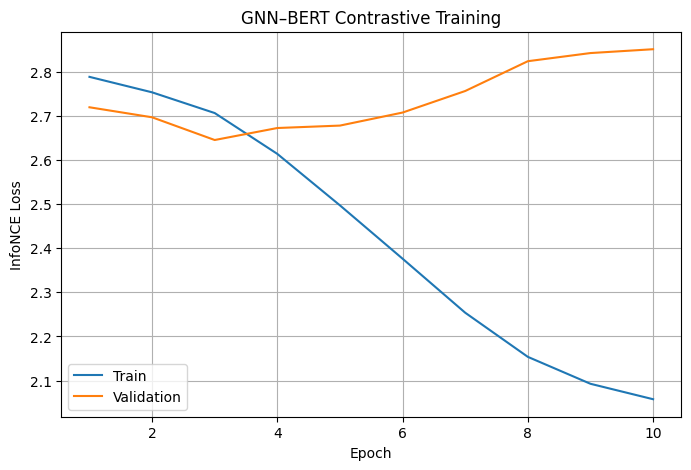

In [26]:
# ============================================================
# CELL 24 — TRAINING CURVE
# ============================================================

import matplotlib.pyplot as plt

history_df = pd.DataFrame(history)

plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["train_loss"],
    label="Train"
)

plt.plot(
    history_df["epoch"],
    history_df["val_loss"],
    label="Validation"
)

plt.xlabel("Epoch")
plt.ylabel("InfoNCE Loss")
plt.title("GNN–BERT Contrastive Training")

plt.legend()

plt.grid()

plt.show()

In [27]:
# ============================================================
# CELL 25 — LOAD BEST MODEL
# ============================================================

checkpoint = torch.load(
    "/kaggle/working/musiccaps_dual_encoder_best.pt",
    map_location=DEVICE
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

model.eval()

print(
    "Loaded epoch:",
    checkpoint["epoch"]
)

print(
    "Validation loss:",
    checkpoint["val_loss"]
)

Loaded epoch: 3
Validation loss: 2.6450822283239925


In [28]:
# ============================================================
# CELL 26 — GENERATE AUDIO + TEXT EMBEDDINGS
# ============================================================

@torch.no_grad()
def extract_embeddings(
    model,
    loader
):

    model.eval()

    all_audio = []
    all_text = []
    all_ytids = []
    all_captions = []


    for batch in tqdm(
        loader,
        desc="Extracting embeddings"
    ):

        graphs = batch["graphs"].to(
            DEVICE
        )

        input_ids = batch[
            "input_ids"
        ].to(DEVICE)

        attention_mask = batch[
            "attention_mask"
        ].to(DEVICE)


        audio_emb = model.encode_audio(
            graphs
        )

        text_emb = model.encode_text(
            input_ids,
            attention_mask
        )


        all_audio.append(
            audio_emb.cpu()
        )

        all_text.append(
            text_emb.cpu()
        )

        all_ytids.extend(
            batch["ytids"]
        )

        all_captions.extend(
            batch["captions"]
        )


    return (
        torch.cat(all_audio),
        torch.cat(all_text),
        all_ytids,
        all_captions
    )


test_audio_emb, test_text_emb, test_ytids, test_captions = (
    extract_embeddings(
        model,
        test_loader
    )
)


print(
    "Audio embeddings:",
    test_audio_emb.shape
)

print(
    "Text embeddings:",
    test_text_emb.shape
)

Extracting embeddings:   0%|          | 0/175 [00:00<?, ?it/s]

Audio embeddings: torch.Size([2797, 256])
Text embeddings: torch.Size([2797, 256])


In [29]:
# ============================================================
# CELL 27 — SIMILARITY MATRIX
# ============================================================

# Both embeddings are already normalized

similarity_matrix = (
    test_audio_emb
    @
    test_text_emb.T
)

print(
    "Similarity matrix:",
    similarity_matrix.shape
)

Similarity matrix: torch.Size([2797, 2797])


In [30]:
# ============================================================
# CELL 28 — RETRIEVAL METRICS
# ============================================================

def recall_at_k(
    similarity,
    direction="text_to_audio",
    ks=(1, 5, 10)
):

    if direction == "text_to_audio":

        # Rows = text queries
        # Columns = audio candidates

        sim = similarity.T

    else:

        # Rows = audio queries
        # Columns = text candidates

        sim = similarity


    rankings = torch.argsort(
        sim,
        dim=1,
        descending=True
    )


    targets = torch.arange(
        sim.size(0)
    )


    results = {}


    for k in ks:

        top_k = rankings[:, :k]

        correct = (
            top_k == targets.unsqueeze(1)
        ).any(dim=1)


        results[f"R@{k}"] = (
            correct.float().mean().item()
        )


    return results

In [31]:
# ============================================================
# CELL 29 — RETRIEVAL RESULTS
# ============================================================

caption_to_audio = recall_at_k(
    similarity_matrix,
    direction="text_to_audio"
)

audio_to_caption = recall_at_k(
    similarity_matrix,
    direction="audio_to_text"
)


results = pd.DataFrame(
    {
        "Metric": [
            "R@1",
            "R@5",
            "R@10"
        ],

        "Caption → Audio": [
            caption_to_audio["R@1"],
            caption_to_audio["R@5"],
            caption_to_audio["R@10"]
        ],

        "Audio → Caption": [
            audio_to_caption["R@1"],
            audio_to_caption["R@5"],
            audio_to_caption["R@10"]
        ]
    }
)


display(results)

,Metric,Caption → Audio,Audio → Caption
0,R@1,0.000358,0.000715
1,R@5,0.003575,0.002145
2,R@10,0.008581,0.005363


In [32]:
# ============================================================
# CELL 30 — QUALITATIVE RETRIEVAL
# ============================================================

def retrieve_audio_for_caption(
    query_index,
    top_k=3
):

    scores = similarity_matrix[
        :,
        query_index
    ]

    top_indices = torch.argsort(
        scores,
        descending=True
    )[:top_k]


    rows = []


    for rank, idx in enumerate(
        top_indices
    ):

        idx = int(idx)

        rows.append(
            {
                "Rank": rank + 1,
                "YTID": test_ytids[idx],
                "Similarity": float(
                    scores[idx]
                ),
                "Retrieved Caption": test_captions[idx],
                "Audio Path": audio_map[
                    test_ytids[idx]
                ]
            }
        )


    return pd.DataFrame(rows)

In [33]:
# ============================================================
# CELL 31 — 10 QUALITATIVE EXAMPLES
# ============================================================

for query_idx in range(
    min(10, len(test_captions))
):

    print("\n")
    print("=" * 100)

    print(
        "QUERY CAPTION:"
    )

    print(
        test_captions[query_idx]
    )


    print("\nTOP 3 RETRIEVED AUDIO:")

    retrieved = retrieve_audio_for_caption(
        query_idx,
        top_k=3
    )

    display(retrieved)



QUERY CAPTION:
The low quality recording features a ballad song that contains sustained strings, mellow piano melody and soft female vocal singing over it. It sounds sad and soulful, like something you would hear at Sunday services.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,GaNjXwElAUE,0.116239,An acoustic drum is playing a straight groove ...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,jP4M9V_Ka8k,0.112622,The low quality recording features a big band ...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,JOhK7oq9KtU,0.110075,The low quality recording features a live perf...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
a male voice is singing a melody with changing tempos while snipping his fingers rhythmically. The recording sounds like it has been recorded in an empty room. This song may be playing, practicing snipping and singing along.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,-Bu7YaslRW0,0.100862,A synth pad is playing a drone sound in the lo...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,T7ZSZhcsfjA,0.099918,A male vocalist sings this animated melody. Th...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,3OWArQGgmm0,0.099591,The low quality recording features an electric...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
This song contains digital drums playing a simple groove along with two guitars. One strumming chords along with the snare the other one playing a melody on top. An e-bass is playing the footnote while a piano is playing a major and minor chord progression. A trumpet is playing a loud melody alongside the guitar. All the instruments sound flat and are being played by a keyboard. There are little bongo hits in the background panned to the left side of the speakers. Apart from the music you can hear eating sounds and a stomach rumbling. This song may be playing for an advertisement.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,qsRPTMXFGsA,0.108609,A male Latin singer sings this passionate melo...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,jP4M9V_Ka8k,0.107098,The low quality recording features a big band ...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,GaNjXwElAUE,0.106980,An acoustic drum is playing a straight groove ...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
This clip is three tracks playing consecutively. The first one is an electric guitar lead harmony with a groovy bass line, followed by white noise and then a female vocalisation to a vivacious melody with a keyboard harmony, slick drumming, funky bass lines and male backup. The three songs are unrelated and unsynced.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,YZx0_GRtvJk,0.128360,This song has a male vocalist singing a rhythm...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,EC_JNTVDrok,0.127991,This is a funk piece. It has an electronic dru...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,RiqtelZs_2I,0.127688,The low quality recording features Muffled dru...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
A male singer sings this groovy melody. The song is a techno dance song with a groovy bass line, strong drumming rhythm and a keyboard accompaniment. The song is so groovy and serves as a dance track for the dancing children. The audio quality is very poor with high gains and hissing noise.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,OmjfHQB_lcs,0.118047,A male singer sings this passionate melody wit...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,_KYo_89lgf0,0.114216,The Low quality recording features a widely sp...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,Kqo7am5oq0U,0.112443,The low quality recording features a fruity ma...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
someone is playing a high pitched melody on a steel drum. The file is of poor audio-quality.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,snYtQd1S12s,0.100982,The low quality recording features an uptempo ...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,X_nfMNpw9SA,0.098718,An acoustic guitar being played walking down t...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,T7ZSZhcsfjA,0.097540,A male vocalist sings this animated melody. Th...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
low fidelity audio from a live performance featuring a solo direct input acoustic guitar strumming airy, suspended open chords. Also present are occasional ambient sounds, perhaps papers being shuffled.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,H_5wh4aMQe0,0.085590,The low quality recording features a groovy or...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,AVmJF1uaRuE,0.085169,This classical Indian song features a male voi...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,3OWArQGgmm0,0.084938,The low quality recording features an electric...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
The instrumental music features an ensemble that resembles the orchestra. The melody is being played by a brass section while strings provide harmonic accompaniment. At the end of the music excerpt one can hear a double bass playing a long note and then a percussive noise.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,6yB6plsrjO0,0.140385,Music that promotes focus. The music is instru...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,JOhK7oq9KtU,0.134227,The low quality recording features a live perf...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,JaGUY5ULTok,0.130022,This music is instrumental. The tempo is fast ...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
This middle eastern folk song features a male voice. This is accompanied by a string instrument called the oud playing the melody in between lines. A variety of middle-eastern percussion instruments are played in the background. A tambourine is played on every count. A darbuka plays a simple beat. This folk song can be played in a movie scene set in a Moroccan market.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,JOhK7oq9KtU,0.116575,The low quality recording features a live perf...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,GaNjXwElAUE,0.115288,An acoustic drum is playing a straight groove ...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,JaGUY5ULTok,0.114116,This music is instrumental. The tempo is fast ...,/kaggle/input/datasets/pinal03/musiccaps/music...




QUERY CAPTION:
A male voice narrates a monologue to the rhythm of a song in the background. The song is fast tempo with enthusiastic drumming, groovy bass lines,cymbal ride, keyboard accompaniment ,electric guitar and animated vocals. The song plays softly  in the background as the narrator speaks and burgeons when he stops. The song is a classic Rock and Roll and the narration is a Documentary.

TOP 3 RETRIEVED AUDIO:


,Rank,YTID,Similarity,Retrieved Caption,Audio Path
0,1,c4ftOyl3j_Y,0.088989,A solo timpani performance played with mallets...,/kaggle/input/datasets/pinal03/musiccaps/music...
1,2,BGD7J6MP2C8,0.088494,This is an excerpt from an advertisement that ...,/kaggle/input/datasets/pinal03/musiccaps/music...
2,3,-EVRXQpt1-8,0.088064,Someone is playing a guitar-like instrument in...,/kaggle/input/datasets/pinal03/musiccaps/music...


In [34]:
# ============================================================
# CELL 32 — PLAY RETRIEVED AUDIO
# ============================================================

from IPython.display import Audio, display

query_idx = 0

print(
    "QUERY:"
)

print(
    test_captions[query_idx]
)


retrieved = retrieve_audio_for_caption(
    query_idx,
    top_k=3
)


for _, row in retrieved.iterrows():

    print(
        "\nRank:",
        row["Rank"]
    )

    print(
        "Similarity:",
        row["Similarity"]
    )

    print(
        "Caption:",
        row["Retrieved Caption"]
    )

    print(
        "YTID:",
        row["YTID"]
    )

    display(
        Audio(
            row["Audio Path"]
        )
    )

QUERY:
The low quality recording features a ballad song that contains sustained strings, mellow piano melody and soft female vocal singing over it. It sounds sad and soulful, like something you would hear at Sunday services.

Rank: 1
Similarity: 0.11623946577310562
Caption: An acoustic drum is playing a straight groove while an e-bass is playing a bassline that reminds of reggae. This feeling gets enhanced by a e-guitar strumming a short rhythmic chord on the offbeat giving the song its typical reggae vibe. On top of that, someone is playing a melody on a steeldrums. This song may be playing at beachbar.
YTID: GaNjXwElAUE



Rank: 2
Similarity: 0.11262231320142746
Caption: The low quality recording features a big band song that consists of an addictive trumpet melody, simple woodwind melody, groovy trombone and muffled drums that include snare and crash hits. Overall it sounds dull and muffled, but still happy and fun.
YTID: jP4M9V_Ka8k



Rank: 3
Similarity: 0.11007452756166458
Caption: The low quality recording features a live performance of an indie song and it contains passionate female vocal singing over arpeggiated electric guitar melody and shimmering shakers. It is a bit noisy, there are some crowd noises and it sounds passionate, emotional and like an intro section of the song.
YTID: JOhK7oq9KtU


In [35]:
# ============================================================
# CELL 33 — BUILD ZERO-SHOT TAG VOCABULARY
# ============================================================

from collections import Counter


tag_counter = Counter()


for tags in train_df["tags"]:

    for tag in tags:

        tag_counter[tag] += 1


# Select common tags
TOP_N_TAGS = 50

tag_vocabulary = [
    tag
    for tag, count in tag_counter.most_common(
        TOP_N_TAGS
    )
]


print(
    "Number of tags:",
    len(tag_vocabulary)
)

print(
    tag_vocabulary
)

Number of tags: 50
['low quality', 'instrumental', 'passionate', 'noisy', 'emotional', 'energetic', 'slow tempo', 'medium tempo', 'live performance', 'mono', 'amateur recording', 'acoustic drums', 'fast tempo', 'groovy', 'no voices', 'moderate tempo', 'groovy bass', 'punchy kick', 'shimmering hi hats', 'bass guitar', 'electric guitar', 'piano', 'no other instruments', 'punchy snare', 'male voice', 'percussion', 'exciting', 'acoustic guitar', 'instrumental music', 'pop', 'bass', 'male vocal', 'upbeat', 'flat male vocal', 'cheerful', 'romantic', 'happy', 'rock', 'e-bass', 'uptempo', 'mellow', 'joyful', 'melodic singing', 'classical', 'male singer', 'keyboard', 'poor audio quality', 'easygoing', 'bad audio quality', 'lively']


In [36]:
# ============================================================
# CELL 34 — ZERO-SHOT TAG PROMPTS
# ============================================================

tag_prompts = [
    f"a piece of music with {tag}"
    for tag in tag_vocabulary
]


tag_tokens = tokenizer(
    tag_prompts,
    padding=True,
    truncation=True,
    max_length=MAX_TEXT_LENGTH,
    return_tensors="pt"
)


tag_tokens = {
    key: value.to(DEVICE)
    for key, value in tag_tokens.items()
}


with torch.no_grad():

    tag_embeddings = model.encode_text(
        tag_tokens["input_ids"],
        tag_tokens["attention_mask"]
    )


tag_embeddings = tag_embeddings.cpu()


print(
    "Tag embedding shape:",
    tag_embeddings.shape
)

Tag embedding shape: torch.Size([50, 256])


In [37]:
# ============================================================
# CELL 35 — ZERO-SHOT TAG PREDICTION
# ============================================================

def predict_zero_shot_tags(
    audio_embedding,
    top_k=5
):

    # audio_embedding:
    # [embedding_dim]

    scores = (
        audio_embedding
        @
        tag_embeddings.T
    )


    top_scores, top_indices = torch.topk(
        scores,
        k=top_k
    )


    predictions = []

    for score, index in zip(
        top_scores,
        top_indices
    ):

        predictions.append(
            {
                "Tag": tag_vocabulary[
                    int(index)
                ],
                "Score": float(score)
            }
        )


    return pd.DataFrame(
        predictions
    )

In [38]:
# ============================================================
# CELL 36 — ZERO-SHOT EXAMPLES
# ============================================================

for i in range(10):

    print("\n")
    print("=" * 80)

    print(
        "Caption:"
    )

    print(
        test_captions[i]
    )


    print(
        "\nPredicted tags:"
    )

    display(
        predict_zero_shot_tags(
            test_audio_emb[i],
            top_k=5
        )
    )



Caption:
The low quality recording features a ballad song that contains sustained strings, mellow piano melody and soft female vocal singing over it. It sounds sad and soulful, like something you would hear at Sunday services.

Predicted tags:


,Tag,Score
0,groovy,0.062008
1,bad audio quality,0.061784
2,groovy bass,0.049506
3,shimmering hi hats,0.047798
4,flat male vocal,0.045654




Caption:
a male voice is singing a melody with changing tempos while snipping his fingers rhythmically. The recording sounds like it has been recorded in an empty room. This song may be playing, practicing snipping and singing along.

Predicted tags:


,Tag,Score
0,male vocal,0.067083
1,flat male vocal,0.066325
2,groovy,0.063806
3,acoustic drums,0.062885
4,groovy bass,0.062520




Caption:
This song contains digital drums playing a simple groove along with two guitars. One strumming chords along with the snare the other one playing a melody on top. An e-bass is playing the footnote while a piano is playing a major and minor chord progression. A trumpet is playing a loud melody alongside the guitar. All the instruments sound flat and are being played by a keyboard. There are little bongo hits in the background panned to the left side of the speakers. Apart from the music you can hear eating sounds and a stomach rumbling. This song may be playing for an advertisement.

Predicted tags:


,Tag,Score
0,groovy,0.066371
1,punchy snare,0.066349
2,punchy kick,0.064104
3,flat male vocal,0.063524
4,male singer,0.059812




Caption:
This clip is three tracks playing consecutively. The first one is an electric guitar lead harmony with a groovy bass line, followed by white noise and then a female vocalisation to a vivacious melody with a keyboard harmony, slick drumming, funky bass lines and male backup. The three songs are unrelated and unsynced.

Predicted tags:


,Tag,Score
0,punchy snare,0.065677
1,groovy,0.064653
2,punchy kick,0.064463
3,bad audio quality,0.060276
4,male singer,0.060061




Caption:
A male singer sings this groovy melody. The song is a techno dance song with a groovy bass line, strong drumming rhythm and a keyboard accompaniment. The song is so groovy and serves as a dance track for the dancing children. The audio quality is very poor with high gains and hissing noise.

Predicted tags:


,Tag,Score
0,groovy,0.071010
1,flat male vocal,0.070118
2,male vocal,0.066345
3,punchy snare,0.065515
4,male singer,0.063959




Caption:
someone is playing a high pitched melody on a steel drum. The file is of poor audio-quality.

Predicted tags:


,Tag,Score
0,melodic singing,0.109122
1,acoustic guitar,0.108400
2,bass guitar,0.107625
3,bass,0.105611
4,percussion,0.105258




Caption:
low fidelity audio from a live performance featuring a solo direct input acoustic guitar strumming airy, suspended open chords. Also present are occasional ambient sounds, perhaps papers being shuffled.

Predicted tags:


,Tag,Score
0,melodic singing,0.088961
1,lively,0.086389
2,percussion,0.085415
3,instrumental,0.084613
4,keyboard,0.084256




Caption:
The instrumental music features an ensemble that resembles the orchestra. The melody is being played by a brass section while strings provide harmonic accompaniment. At the end of the music excerpt one can hear a double bass playing a long note and then a percussive noise.

Predicted tags:


,Tag,Score
0,groovy,0.075981
1,groovy bass,0.064600
2,flat male vocal,0.059691
3,male vocal,0.058985
4,bad audio quality,0.058619




Caption:
This middle eastern folk song features a male voice. This is accompanied by a string instrument called the oud playing the melody in between lines. A variety of middle-eastern percussion instruments are played in the background. A tambourine is played on every count. A darbuka plays a simple beat. This folk song can be played in a movie scene set in a Moroccan market.

Predicted tags:


,Tag,Score
0,melodic singing,0.070850
1,male vocal,0.070691
2,percussion,0.069174
3,instrumental,0.068941
4,lively,0.068861




Caption:
A male voice narrates a monologue to the rhythm of a song in the background. The song is fast tempo with enthusiastic drumming, groovy bass lines,cymbal ride, keyboard accompaniment ,electric guitar and animated vocals. The song plays softly  in the background as the narrator speaks and burgeons when he stops. The song is a classic Rock and Roll and the narration is a Documentary.

Predicted tags:


,Tag,Score
0,groovy,0.087347
1,punchy kick,0.059806
2,punchy snare,0.059373
3,groovy bass,0.041225
4,male singer,0.033944


In [39]:
# ============================================================
# CELL 37 — ZERO-SHOT TAG EVALUATION
# ============================================================

def evaluate_zero_shot_tags(
    audio_embeddings,
    dataframe,
    top_k=5
):

    y_true = []
    y_pred = []


    for i in tqdm(
        range(len(dataframe))
    ):

        true_tags = set(
            dataframe.iloc[i]["tags"]
        )


        scores = (
            audio_embeddings[i]
            @
            tag_embeddings.T
        )


        top_indices = torch.topk(
            scores,
            k=top_k
        ).indices


        predicted_tags = set(
            tag_vocabulary[
                int(idx)
            ]
            for idx in top_indices
        )


        for tag in tag_vocabulary:

            y_true.append(
                1 if tag in true_tags else 0
            )

            y_pred.append(
                1 if tag in predicted_tags else 0
            )


    precision = precision_score(
        y_true,
        y_pred,
        zero_division=0
    )

    recall = recall_score(
        y_true,
        y_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_true,
        y_pred,
        zero_division=0
    )


    return {
        "Precision@5": precision,
        "Recall@5": recall,
        "F1@5": f1
    }

In [40]:
# ============================================================
# CELL 38 — ZERO-SHOT RESULTS
# ============================================================

zero_shot_results = evaluate_zero_shot_tags(
    test_audio_emb,
    test_df,
    top_k=5
)


print(
    "Zero-shot tag prediction:"
)

for metric, value in zero_shot_results.items():

    print(
        f"{metric}: {value:.4f}"
    )

  0%|          | 0/2797 [00:00<?, ?it/s]

Zero-shot tag prediction:
Precision@5: 0.0415
Recall@5: 0.0826
F1@5: 0.0553


In [41]:
# ============================================================
# CELL 39 — FINAL RESULTS TABLE
# ============================================================

final_results = pd.DataFrame(
    {
        "Task": [
            "Caption → Audio",
            "Caption → Audio",
            "Caption → Audio",
            "Audio → Caption",
            "Audio → Caption",
            "Audio → Caption",
            "Zero-shot Tags",
            "Zero-shot Tags",
            "Zero-shot Tags"
        ],

        "Metric": [
            "R@1",
            "R@5",
            "R@10",
            "R@1",
            "R@5",
            "R@10",
            "Precision@5",
            "Recall@5",
            "F1@5"
        ],

        "Score": [
            caption_to_audio["R@1"],
            caption_to_audio["R@5"],
            caption_to_audio["R@10"],
            audio_to_caption["R@1"],
            audio_to_caption["R@5"],
            audio_to_caption["R@10"],
            zero_shot_results["Precision@5"],
            zero_shot_results["Recall@5"],
            zero_shot_results["F1@5"]
        ]
    }
)


display(final_results)

,Task,Metric,Score
0,Caption → Audio,R@1,0.000358
1,Caption → Audio,R@5,0.003575
2,Caption → Audio,R@10,0.008581
3,Audio → Caption,R@1,0.000715
4,Audio → Caption,R@5,0.002145
5,Audio → Caption,R@10,0.005363
6,Zero-shot Tags,Precision@5,0.041545
7,Zero-shot Tags,Recall@5,0.082646
8,Zero-shot Tags,F1@5,0.055294


In [42]:
# ============================================================
# CELL 40 — SAVE RESULTS
# ============================================================

torch.save(
    {
        "audio_embeddings": test_audio_emb,
        "text_embeddings": test_text_emb,
        "ytids": test_ytids,
        "captions": test_captions
    },
    "/kaggle/working/musiccaps_test_embeddings.pt"
)


final_results.to_csv(
    "/kaggle/working/musiccaps_task4_results.csv",
    index=False
)


print(
    "Saved:"
)

print(
    "/kaggle/working/musiccaps_test_embeddings.pt"
)

print(
    "/kaggle/working/musiccaps_task4_results.csv"
)

Saved:
/kaggle/working/musiccaps_test_embeddings.pt
/kaggle/working/musiccaps_task4_results.csv
